## Frozen Lake - Large Problem

In [14]:
#!pip install mdptoolbox-hiive

In [1]:
# Begin by importing libraries
import gym
from hiive.mdptoolbox.mdp import PolicyIteration, ValueIteration, QLearning
from gym.envs.toy_text.frozen_lake import generate_random_map

import numpy as np
import pandas as pd
import seaborn as sns
import time

np.random.seed(42)

import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

## MDP setup

In [2]:
arrows, clrs = {0: '←', 1: '↓',2: '→',3: '↑'}, {b'G': 'green', b'F': 'white', b'S': 'blue',b'H': 'k'}

In [210]:
def plot_frozen_lake(env, policy=None, title='Frozen Lake Environment'):
    fig = plt.figure(figsize=(5, 5))
    tiles = env.nrow
    ax = fig.add_subplot(111, xlim=(-.01, tiles+0.01), ylim=(-.01, tiles+0.01))
    plt.title(title, fontsize=14, y=1.01)
    for i in range(tiles):
        for j in range(tiles):
            y, x = tiles - i - 1, j
            p = plt.Rectangle([x, y], 1, 1, linewidth=0.5, edgecolor='k')
            p.set_facecolor(clrs[env.desc[i,j]])
            ax.add_patch(p)
            
            if policy is not None:
                text = ax.text(x+0.3, y+0.3, 
                               arrows[policy[i, j]],horizontalalignment='center', size=20, verticalalignment='center', color='b')

In [3]:
# code based on https://medium.com/analytics-vidhya/solving-the-frozenlake-environment-from-openai-gym-using-value-iteration-5a078dffe438
def generate_score(env, policy, print_info=False, eps=1000):
    misses, spts_lst = 0, []
    for ep in range(eps):
        obs, steps = env.reset(), 0
        while True:
            action = policy[obs]
            obs, reward, complete, _ = env.step(action)
            steps = steps+1
            if reward == 1 and complete:
                spts_lst.append(steps)
                break
            elif reward == 0 and complete:
                misses = misses+ 1
                break
    ave_steps, std_steps = np.mean(spts_lst), np.std(spts_lst)
    pctt_fail  = (misses/eps)* 100

    return ave_steps, std_steps, pctt_fail

In [5]:
random_map = generate_random_map(size=18, p=0.8)
 
env = gym.make("FrozenLake-v0", desc=random_map)
env.reset()
env.render()


SHFFFFFHFFFHHFFFFF
FFFFFFFFFFFFFFFHHH
FFFFFFFHFFFFFFHFHH
FHFFFFFFHFFFFHFHFF
FHFFFFFFHFFFFFFFHF
FFFFFFFFFFFFFFHFFF
FFFFHHFHHFHFHHFFFF
HHFFFFFFHFFFFHHFFF
FFFFFFHFFFHFFFFFFF
FFFHFFFFFFFFFFFFHF
FFHHFFHFFFFHHFFFFH
HFFFFHFFFFFFFFFFFF
FFFHFFFFFFHFHFFFFF
FFFFFFHHHFFHFHHHFF
HFFFHFFFFHFFHFFFFF
HHHHFFFFFFHFFFFFFF
FFFFHFFFFFFFFFFFFH
FFFFFFFHHFFFFFFFFG


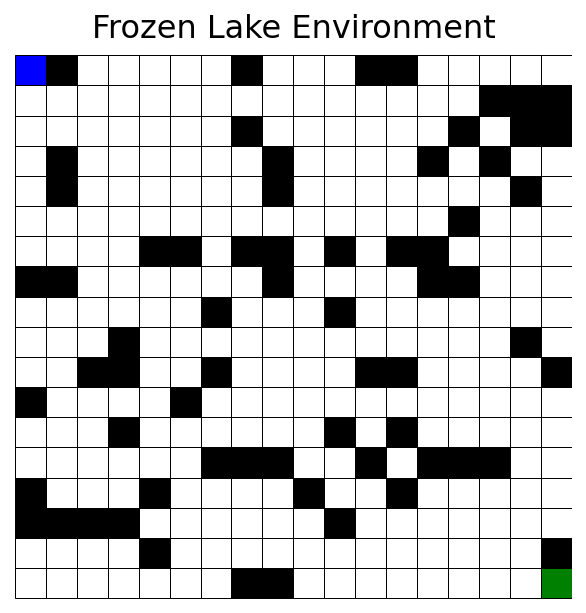

In [7]:
env.max_episode_steps=None

rows, cols = env.nrow, env.ncol
T, R = np.zeros((4, rows*cols, rows*cols)), np.zeros((4, rows*cols, rows*cols))

old_state = np.inf

for square in env.P:
    for action in env.P[square]:
        for i in range(len(env.P[square][action])):
            new_state = env.P[square][action][i][1]
            if new_state == old_state:
                T[action][square][env.P[square][action][i][1]] = T[action][square][old_state] + env.P[square][action][i][0]
                R[action][square][env.P[square][action][i][1]] = R[action][square][old_state] + env.P[square][action][i][2]
            else:
                T[action][square][env.P[square][action][i][1]] = env.P[square][action][i][0]
                R[action][square][env.P[square][action][i][1]] = env.P[square][action][i][2]
            old_state = env.P[square][action][i][1]
 
plot_frozen_lake(env)

## VI

In [52]:
def val_iteration(t, r, gammas, epsilons, show_results=False, max_iterations=10000000):
    time_start = time.time()
    df = pd.DataFrame(0.0, index=np.arange(len(gammas)*len(epsilons)),
                        columns=['gamma', 'epsilon', 'time', 'iterations', 'reward', 'average_steps', 'steps_stddev', 'success_percent', 'policy', 'avg_util', 'max_util', 'error'])
        
    test_num = 0
    for g in gammas:
        for e in epsilons:
            test = ValueIteration(t, r, gamma=g, epsilon=e, max_iter=max_iterations)
            
            runs,Time,iterations,max_reward  = test.run(), runs[-1]['Time'], runs[-1]['Iteration'], uns[-1]['Max V']
            
            max_util, avg_util, ers = [], [], []
            for run in runs:
                ers.append(run['Error'])
                avg_util.append(run['Mean V'])
                max_util.append(run['Max V'])
            
            policy = np.array(test.policy)
            policy = policy.reshape(18,18)
            
            df['time'][test_num]         = Time, iterations
            df['gamma'][test_num], df['epsilon'][test_num]        = g, e
            df['iterations'][test_num], df['reward'][test_num]   = iterations, max_reward
            df['avg_util'][test_num], df['max_util'][test_num] = {tuple(avg_util)}, {tuple(max_util)}
            df['error'][test_num], df['policy'][test_num]        = np.mean(ers), {test.policy}
                        
            if show_results:
                title = 'FrozenLake_Value_Iteration' + str(rows) + 'x' + str(cols) + '_g' + str(g) + '_e' + str(e)
                plot_frozen_lake(env, policy, title)
            
            test_num += 1
                
    end_time = time.time() - time_start
    
    policies = df['policy']
    for i,p in enumerate(policies):
        pol = list(p)[0]
        steps, steps_stddev, failures = generate_score(env, pol, show_results)
        df['success_percent'][i]   = 100-failures      
        df['steps_stddev'][i]  = steps_stddev
        df['average_steps'][i] = steps
        
    df = df.fillna(0)
        
    return df

## set up the problem

In [53]:
epsilons = [1e-2, 1e-3, 1e-4, 1e-5, 1e-8, 1e-10, 1e-11, 1e-12]
gammas   = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99]
vi_res  = val_iteration(T, R, gammas, epsilons, show_results=False)

Gamma	Eps	Time	Iter	Reward

0.10,	1E-02,	0.00,	1,	0.333333
0.10,	1E-03,	0.00,	2,	0.344444
0.10,	1E-04,	0.00,	3,	0.345185
0.10,	1E-05,	0.00,	4,	0.345235
0.10,	1E-08,	0.00,	7,	0.345239
0.10,	1E-10,	0.00,	9,	0.345239
0.10,	1E-11,	0.00,	10,	0.345239
0.10,	1E-12,	0.00,	11,	0.345239
0.20,	1E-02,	0.00,	2,	0.355556
0.20,	1E-03,	0.00,	3,	0.358519
0.20,	1E-04,	0.00,	5,	0.358979
0.20,	1E-05,	0.00,	6,	0.358990
0.20,	1E-08,	0.00,	10,	0.358992
0.20,	1E-10,	0.00,	13,	0.358992
0.20,	1E-11,	0.00,	14,	0.358992
0.20,	1E-12,	0.00,	16,	0.358992
0.30,	1E-02,	0.00,	3,	0.373333
0.30,	1E-03,	0.00,	4,	0.374667
0.30,	1E-04,	0.00,	6,	0.375077
0.30,	1E-05,	0.00,	8,	0.375102
0.30,	1E-08,	0.00,	13,	0.375103
0.30,	1E-10,	0.00,	17,	0.375103
0.30,	1E-11,	0.00,	19,	0.375103
0.30,	1E-12,	0.00,	21,	0.375103
0.40,	1E-02,	0.00,	3,	0.389630
0.40,	1E-03,	0.00,	5,	0.393844
0.40,	1E-04,	0.00,	8,	0.394316
0.40,	1E-05,	0.00,	10,	0.394333
0.40,	1E-08,	0.00,	17,	0.394336
0.40,	1E-10,	0.00,	22,	0.394336
0.40,	1E-11,	0.00,	24,	0.3943

/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


## Generate plots


RL Model Optimization (small and large environment):
- [ ] Reward vs iterations
- [x] Reward vs discount/gamma (PI, VI)
- [ ] Reward vs epsilon (Q learning)
- [ ] Reward vs epsilon decay (Q learning)
- [ ] Reward vs alpha (Q learning)
- [ ] Time vs iterations
- [ ] Time vs discount/gamma (PI, VI)
- [ ] Time vs epsilon (Q learning)
- [ ] Time vs epsilon decay (Q learning)
- [ ] Time vs alpha (Q learning)
- [ ] Delta convergence

Environment Analysis:
- [ ] Original Environment view
- [ ] Environment view with optimal policy found
- [ ] Relative reward vs environment complexity (PI ,VI, Q learning)
- [ ] Time to solution vs environment complexity (PI, VI, Q learning)


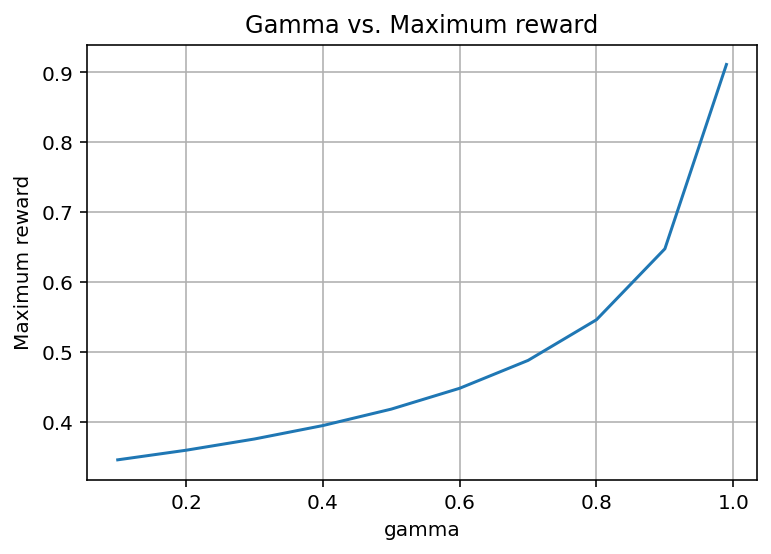

In [56]:
vi_res.groupby('gamma')['reward'].max().to_frame().plot(legend=False)
plt.xlabel('gamma')
plt.ylabel('Maximum reward')
plt.grid()
plt.title('Gamma vs. Maximum reward');

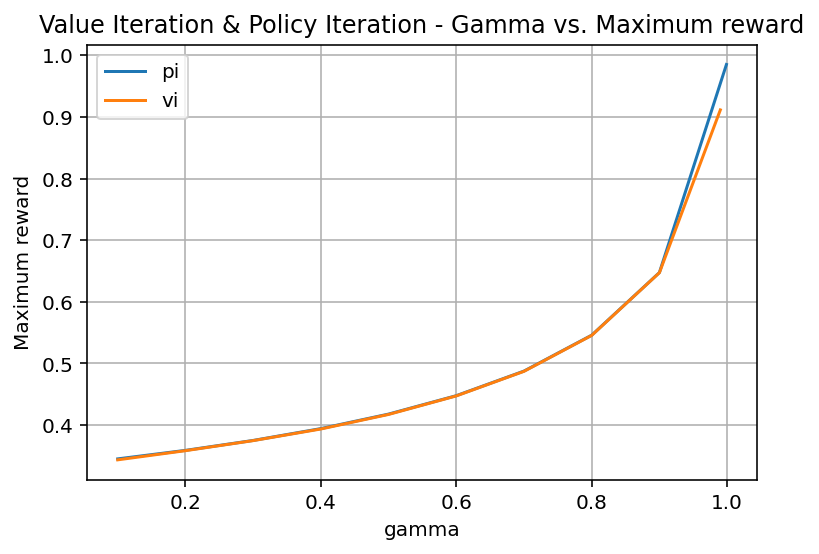

In [57]:
pi_res.groupby('gamma')['reward'].mean().plot(label='pi')
vi_res.groupby('gamma')['reward'].mean().plot(label='vi')
plt.xlabel('gamma')
plt.ylabel('Maximum reward')
plt.legend()
plt.grid()
plt.title('Value Iteration & Policy Iteration - Gamma vs. Maximum reward');

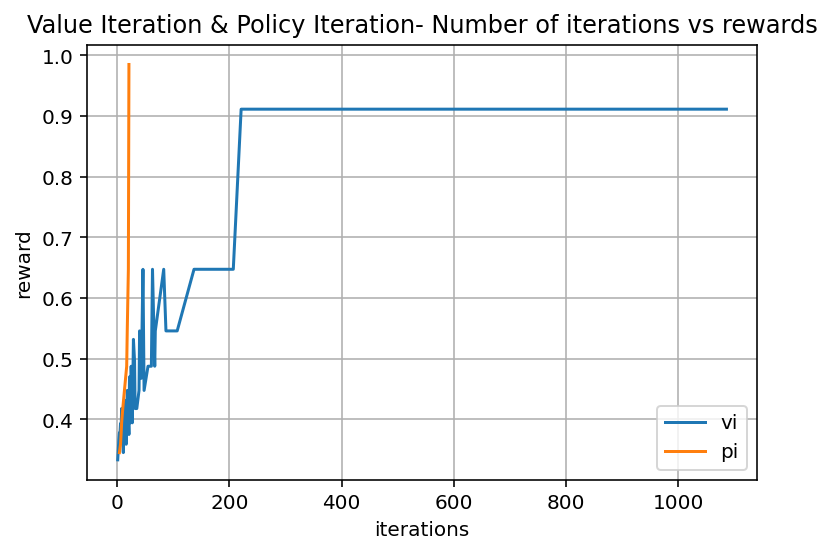

In [58]:
vi_res.groupby('iterations')['reward'].mean().plot(label='vi')
pi_res.groupby('iterations')['reward'].mean().plot(label='pi')
plt.ylabel('reward')
plt.legend()
plt.grid()
plt.title('Value Iteration & Policy Iteration- Number of iterations vs rewards');

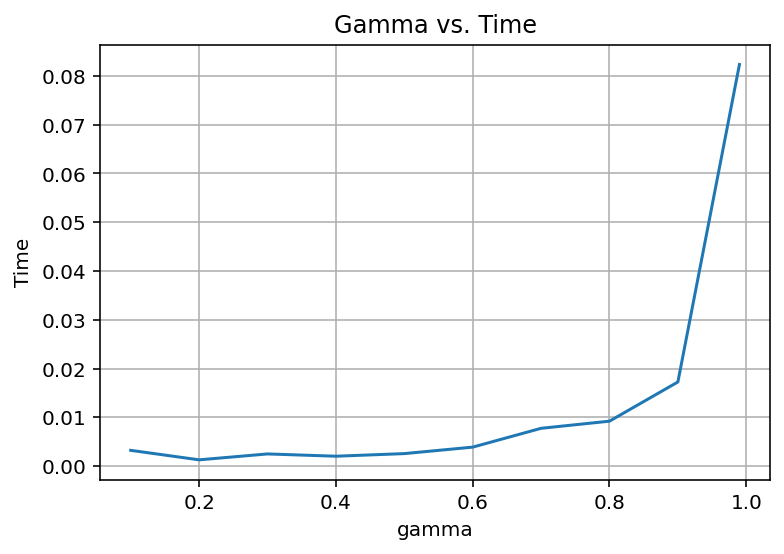

In [59]:
rs = vi_res.groupby('gamma')['time'].agg(['max','min'])
rs['diff'] = rs['max']-rs['min']
rs.plot(y='diff', legend=False)
plt.xlabel('gamma')
plt.ylabel('Time')
plt.grid()
plt.title('Gamma vs. Time');

## Res - VI

Best Result:

Success = 0.60
Gamma = 0.70
Epsilon= 1E-08


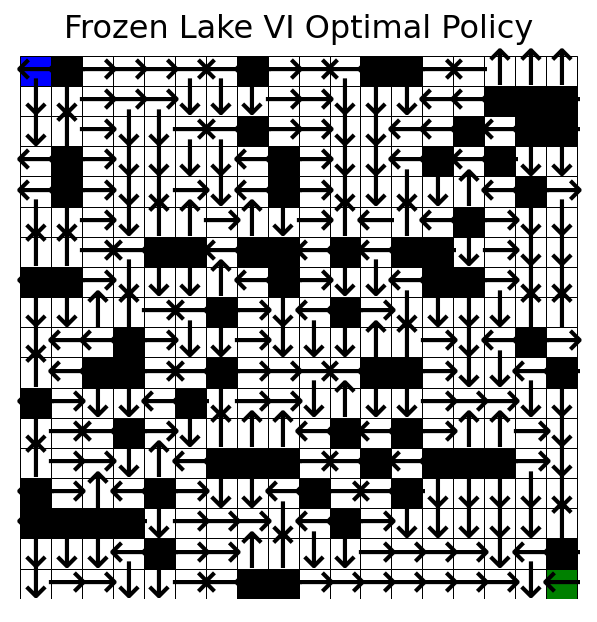

In [60]:
best_run = vi_res['success_percent'].argmax()
best_policy = vi_res['policy'][best_run]
best_policy = np.array(list(best_policy)[0])
best_policy = best_policy.reshape(rows, cols)

title='Frozen Lake Value Iteration Optimal Policy'
plot_frozen_lake(env, best_policy, title)

## PI


In [61]:
def policy_iteration(t, r, gammas, show_results=False, max_iterations=10000000):
    time_start = time.time()
    df = pd.DataFrame(0.0, index=np.arange(len(gammas)), columns=['gamma', 'epsilon', 'time', 'iterations', 'reward', 'average_steps', 'steps_stddev', 'success_percent', 'policy', 'mean_rewards', 'max_utils', 'error'])
        
    test_num = 0
    for g in gammas:
        test = PolicyIteration(t, r, gamma=g, max_iter=max_iterations, eval_type="iterative")
        
        runs  = test.run()
        Time  = test.time
        iters = test.iter
        max_util  = runs[-1]['Max V']
                
        max_utils, mean_rewards, ers = [], [], []
        for run in runs:
            max_utils.append(run['Max V'])
            mean_rewards.append(run['Mean V'])
            ers.append(run['Error'])
        
        policy = np.array(test.policy)
        policy = policy.reshape(18,18)
        
        df['gamma'][test_num], df['time'][test_num]        = g, Time
        df['iterations'][test_num], df['reward'][test_num]   = iters, max_util
        df['mean_rewards'][test_num], df['max_utils'][test_num] = {tuple(mean_rewards)}, {tuple(max_utils)}
        df['error'][test_num], df['policy'][test_num]        = np.mean(ers), {test.policy}
                
        if show_results:
            title = 'frozenlake_pi_' + str(rows) + 'x' + str(cols) + '_g' + str(g)
            plot_frozen_lake(env, policy, title)
        
        test_num += 1
            
    end_time = time.time() - time_start
    
    policies = data['policy']
    for i,p in enumerate(policies):
        pol = list(p)[0]
        steps, steps_stddev, failures = generate_score(env, pol, show_results)
        data['success_percent'][i]   = 100-failures      
        data['average_steps'][i] = steps
        data['steps_stddev'][i]  = steps_stddev
        
    data = data.fillna(0)        
    return data

## Setup

In [62]:
np.arange(0.1,1.0,0.1)

array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

In [63]:
gammas   = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.999])
pi_res  = policy_iteration(T, R, gammas, show_results=False)

Gamma	Time	Iteration	Reward
0.10,	0.00,	4,	0.345185
0.20,	0.00,	6,	0.358979
0.30,	0.00,	7,	0.375077
0.40,	0.01,	8,	0.394316
0.50,	0.00,	10,	0.417854
0.60,	0.02,	13,	0.447725
0.70,	0.01,	17,	0.487637
0.80,	0.02,	18,	0.545871
0.90,	0.03,	20,	0.647477
1.00,	0.32,	21,	0.985122
Time taken: 0.45


/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


## Res

Best Result:

Success = 0.10
Gamma = 1.00


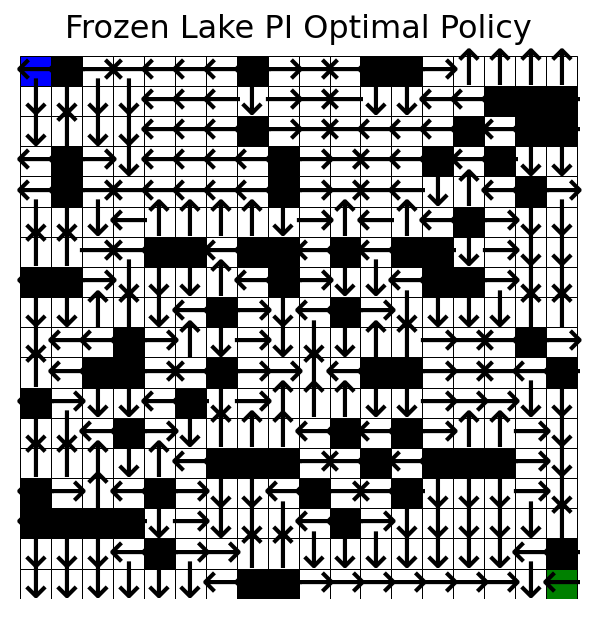

In [70]:
best_run = pi_res['reward'].argmax()

best_policy = pi_res['policy'][best_run]
best_policy = np.array(list(best_policy)[0])
best_policy = best_policy.reshape(rows, cols)

plot_frozen_lake(env, best_policy, 'Frozen Lake PI Optimal Policy')

## QL

In [25]:
def q_learning(t, r, gammas, alphas, alpha_decays=[0.99], epsilon_decays=[0.99], n_iterations=[10000], show_results=False):
    num_tests = len(n_iterations) * len(alphas) * len(alpha_decays) * len(epsilon_decays)* * len(gammas)
    df = pd.DataFrame(0.0, index=np.arange(num_tests),
                        columns=['gamma', 'alpha', 'alpha_decay', 'epsilon_decay', 'iterations', 'time', 'reward', 'average_steps', 'steps_stddev', 'success_percent', 'policy', 'avg_util', 'max_rewards', 'error'])

    test_num = 0
    for g in gammas:
        for a in alphas:
            for alpha_decay in alpha_decays:
                for epsilon_decay in epsilon_decays:
                    for n in n_iterations:
                             %(g, a, alpha_decay, epsilon_decay, n))
                    
                        test = QLearning(t, r, gamma=g, alpha=a, alpha_decay=alpha_decay, epsilon_decay=epsilon_decay, n_iter=n)
                        runs  = test.run()
                        time  = runs[-1]['Time']
                        iters = runs[-1]['Iteration']
                        max_reward  = runs[-1]['Max V']
                        
                        max_rewards, avg_util, errors = [], [], []
                        for run in runs:
                            max_rewards.append(run['Max V'])
                            avg_util.append(run['Mean V'])
                            errors.append(run['Error'])
                        
                        policy = np.array(test.policy)
                        policy = policy.reshape(18,18)
                        
                        df['gamma'][test_num], df['alpha'][test_num] = g, a
                        df['alpha_decay'][test_num], df['epsilon_decay'][test_num]   = alpha_decay, epsilon_decay
                         = 
                        df['time'][test_num]          = time
                        df['iterations'][test_num]    = iters
                        df['reward'][test_num]        = max_reward
                        df['avg_util'][test_num]      = {tuple(avg_util)}
                        df['max_rewards'][test_num]   = {tuple(max_rewards)}
                        df['error'][test_num]         = {tuple(errors)}
                        df['policy'][test_num]        = {test.policy}
                                                
                        if show_results:
                            title = 'FrozenLake_Q_Learning_' + str(rows) + 'x' + str(cols) + '_g' + str(g) + '_a' + str(a) + '_adecay' + str(alpha_decay) + '_edecay' + str(epsilon_decay) + '_iter' + str(n)
                            plot_frozen_lake(env, policy, title)
                        
                        test_num += 1
            
    policies = df['policy']
    
    for i,p in enumerate(policies):
        pol = list(p)[0]
        steps, steps_stddev, failures = generate_score(env, pol, show_results)
        df['average_steps'][i], df['steps_stddev'][i] = steps, steps_stddev
        df['success_percent'][i]   = 100-failures      
        
    df = df.fillna(0)        
    return df

## Setup

Gamma,	Alpha,	Time,	Iter,	Reward

Test Num 1/216
Gamma: 0.10,	Alpha: 0.01,	Alpha Decay:0.850,	Epsilon Decay:0.850,	Iterations:10000
0.10,	0.01,	1.23,	10000,	0.000000
Test Num 2/216
Gamma: 0.10,	Alpha: 0.01,	Alpha Decay:0.850,	Epsilon Decay:0.850,	Iterations:100000
0.10,	0.01,	11.69,	100000,	0.000000
Test Num 3/216
Gamma: 0.10,	Alpha: 0.01,	Alpha Decay:0.850,	Epsilon Decay:0.850,	Iterations:1000000
0.10,	0.01,	119.44,	1000000,	0.033335
Test Num 4/216
Gamma: 0.10,	Alpha: 0.01,	Alpha Decay:0.850,	Epsilon Decay:0.999,	Iterations:10000
0.10,	0.01,	1.21,	10000,	0.000000
Test Num 5/216
Gamma: 0.10,	Alpha: 0.01,	Alpha Decay:0.850,	Epsilon Decay:0.999,	Iterations:100000
0.10,	0.01,	11.71,	100000,	0.005982
Test Num 6/216
Gamma: 0.10,	Alpha: 0.01,	Alpha Decay:0.850,	Epsilon Decay:0.999,	Iterations:1000000
0.10,	0.01,	114.79,	1000000,	0.077391
Test Num 7/216
Gamma: 0.10,	Alpha: 0.01,	Alpha Decay:0.999,	Epsilon Decay:0.850,	Iterations:10000
0.10,	0.01,	1.25,	10000,	0.000000
Test Num 8/216
Gamma: 0.

<ipython-input-2-d388de5beb42>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(5, 5))


Test Num 22/216
Gamma: 0.10,	Alpha: 0.15,	Alpha Decay:0.999,	Epsilon Decay:0.999,	Iterations:10000
0.10,	0.15,	1.18,	10000,	0.144260
Test Num 23/216
Gamma: 0.10,	Alpha: 0.15,	Alpha Decay:0.999,	Epsilon Decay:0.999,	Iterations:100000
0.10,	0.15,	11.67,	100000,	0.000000
Test Num 24/216
Gamma: 0.10,	Alpha: 0.15,	Alpha Decay:0.999,	Epsilon Decay:0.999,	Iterations:1000000
0.10,	0.15,	118.43,	1000000,	0.107019
Test Num 25/216
Gamma: 0.10,	Alpha: 0.25,	Alpha Decay:0.850,	Epsilon Decay:0.850,	Iterations:10000
0.10,	0.25,	1.20,	10000,	0.000000
Test Num 26/216
Gamma: 0.10,	Alpha: 0.25,	Alpha Decay:0.850,	Epsilon Decay:0.850,	Iterations:100000
0.10,	0.25,	11.81,	100000,	0.000000
Test Num 27/216
Gamma: 0.10,	Alpha: 0.25,	Alpha Decay:0.850,	Epsilon Decay:0.850,	Iterations:1000000
0.10,	0.25,	117.09,	1000000,	0.071204
Test Num 28/216
Gamma: 0.10,	Alpha: 0.25,	Alpha Decay:0.850,	Epsilon Decay:0.999,	Iterations:10000
0.10,	0.25,	1.22,	10000,	0.000000
Test Num 29/216
Gamma: 0.10,	Alpha: 0.25,	Alpha Dec

/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took an average of nan steps to get the frisbee
And you fell in the hole 100.00 % of the times
You took a

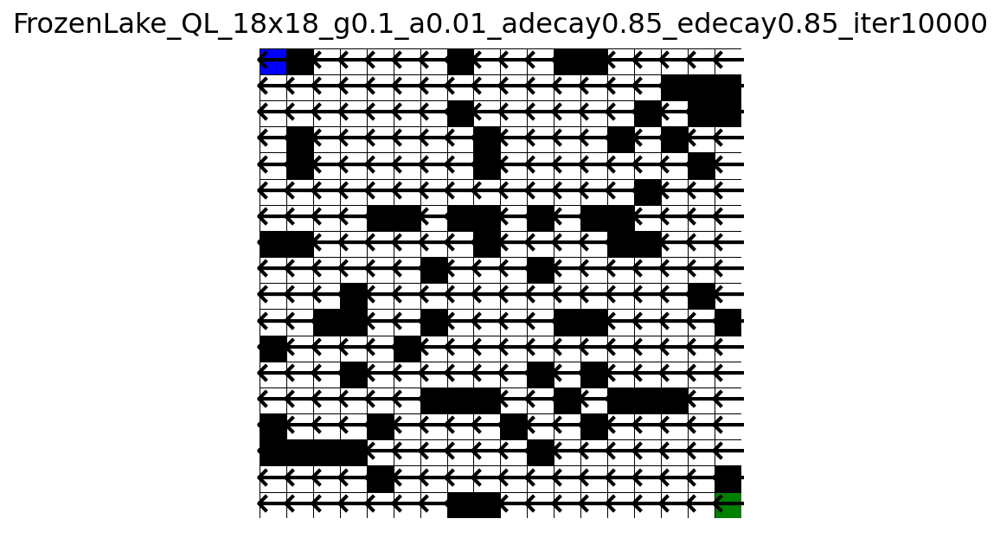

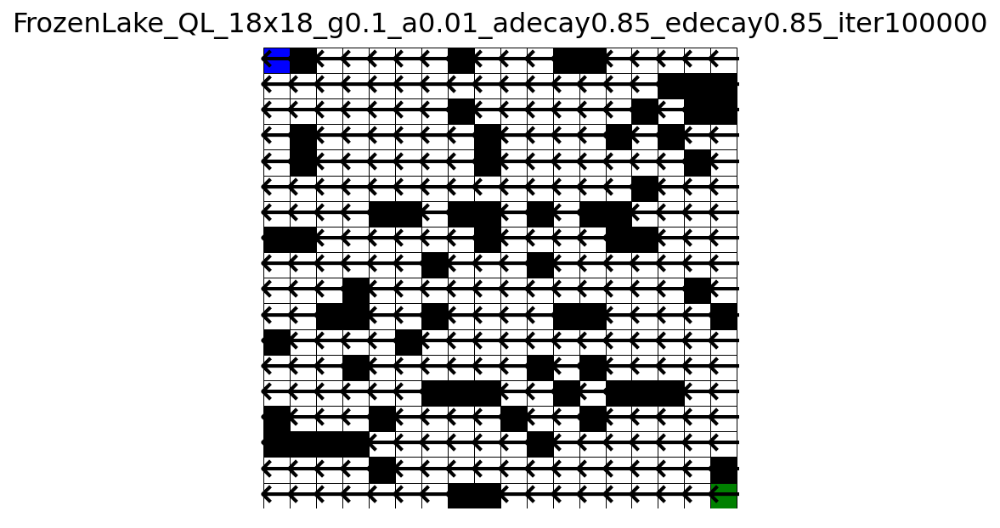

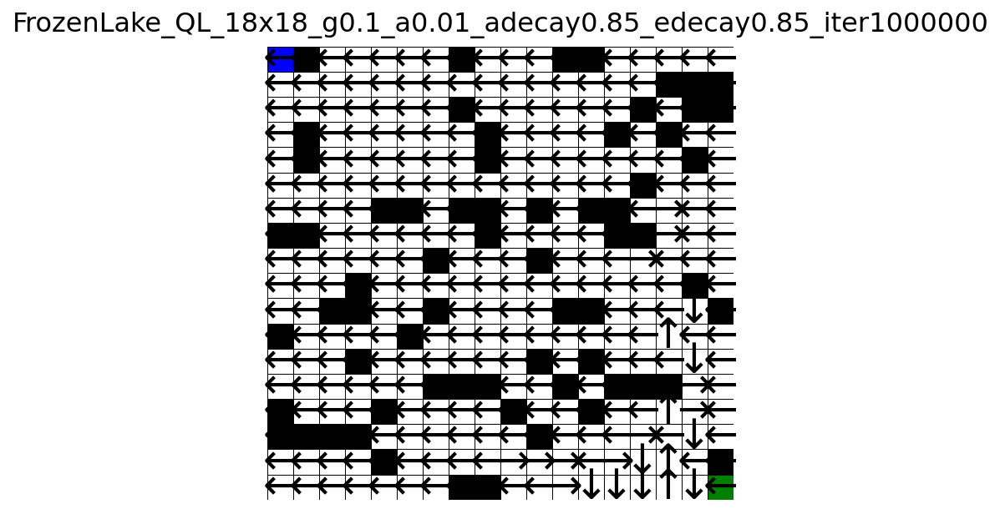

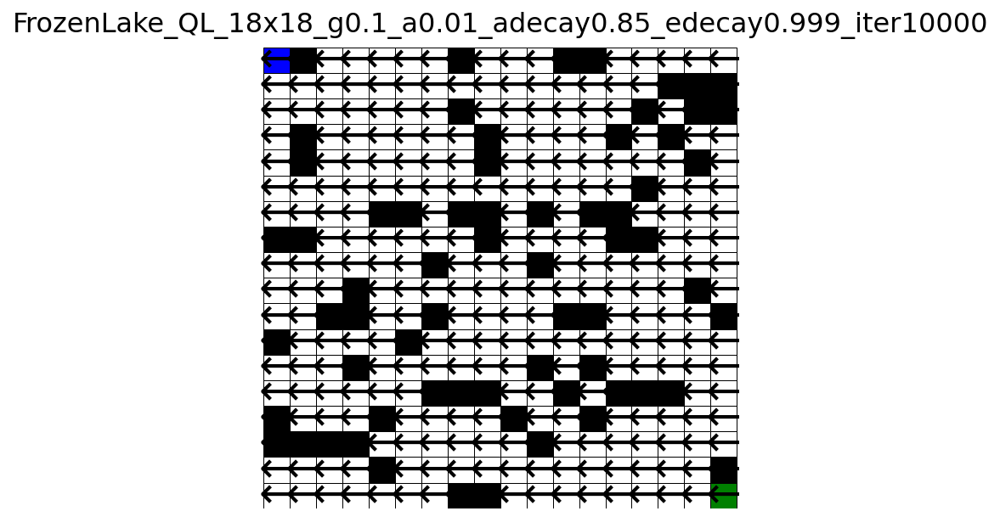

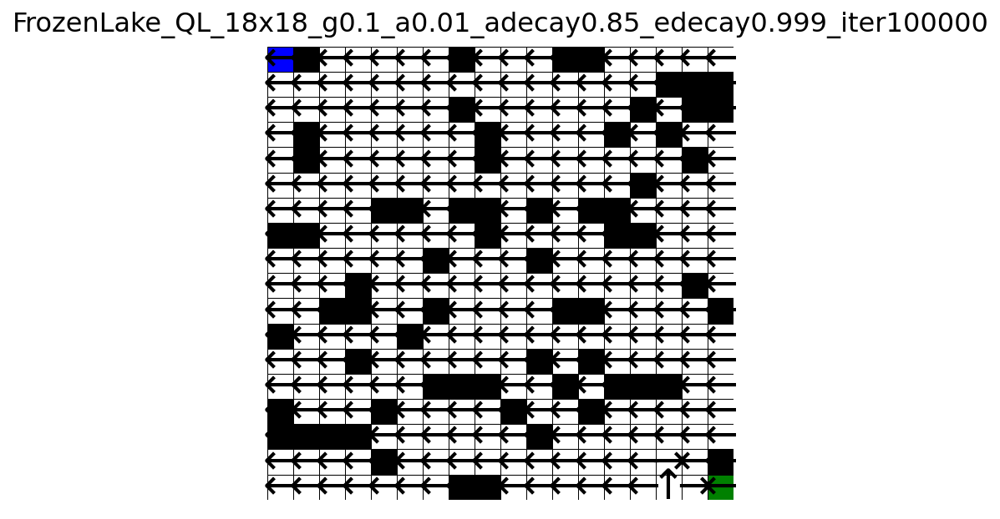

...

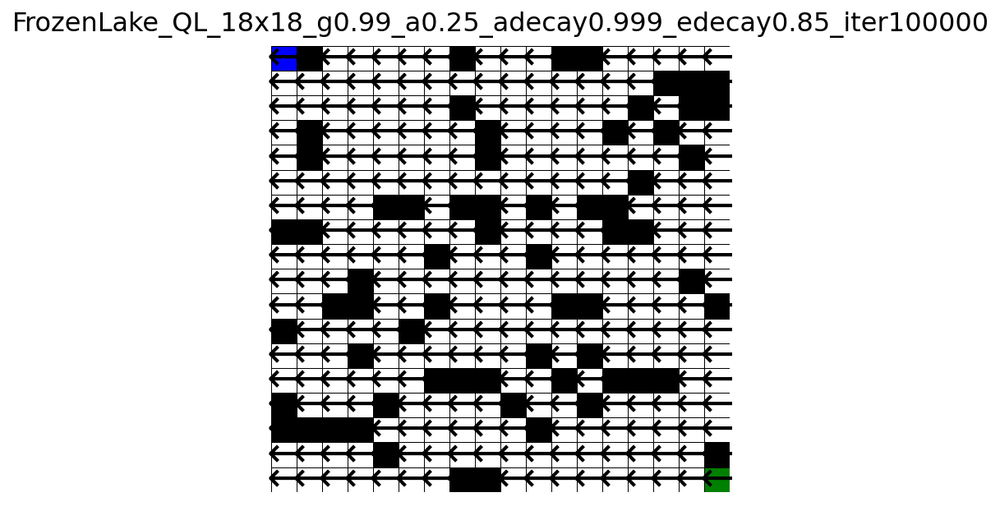

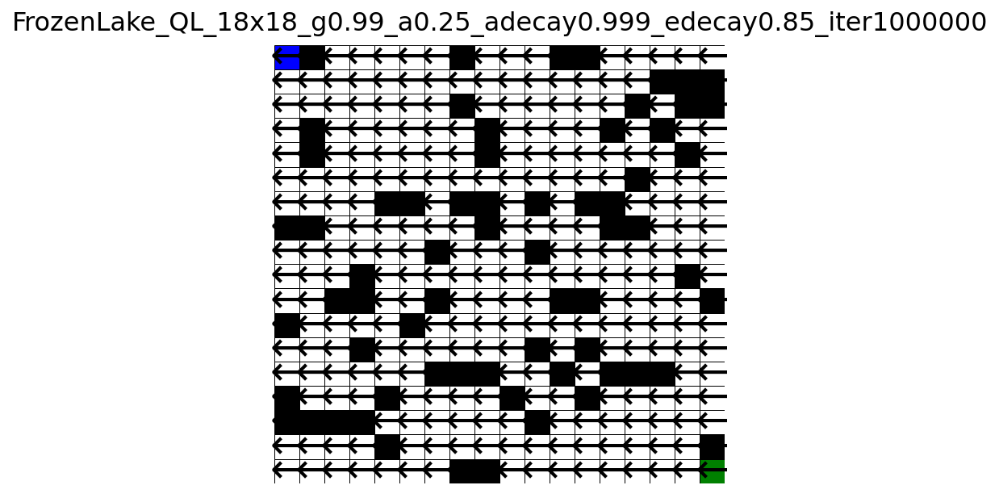

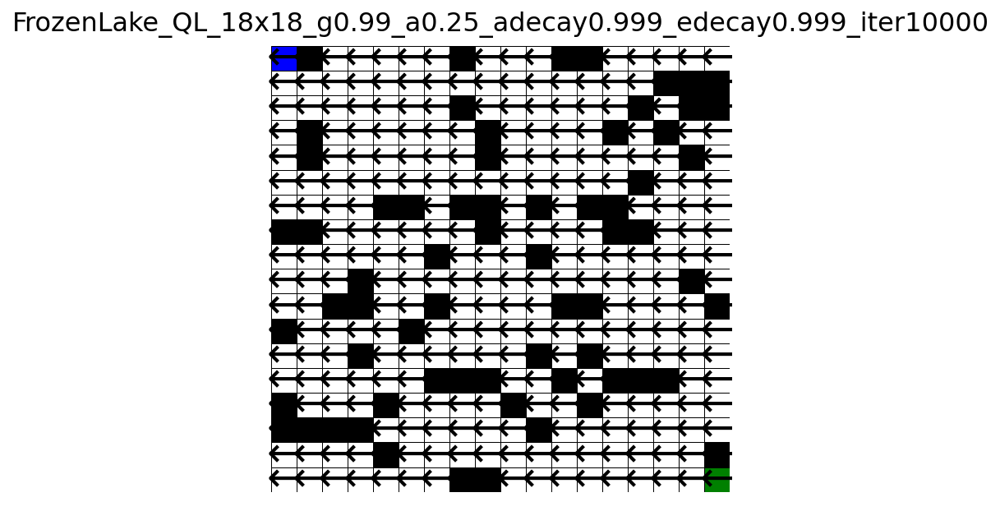

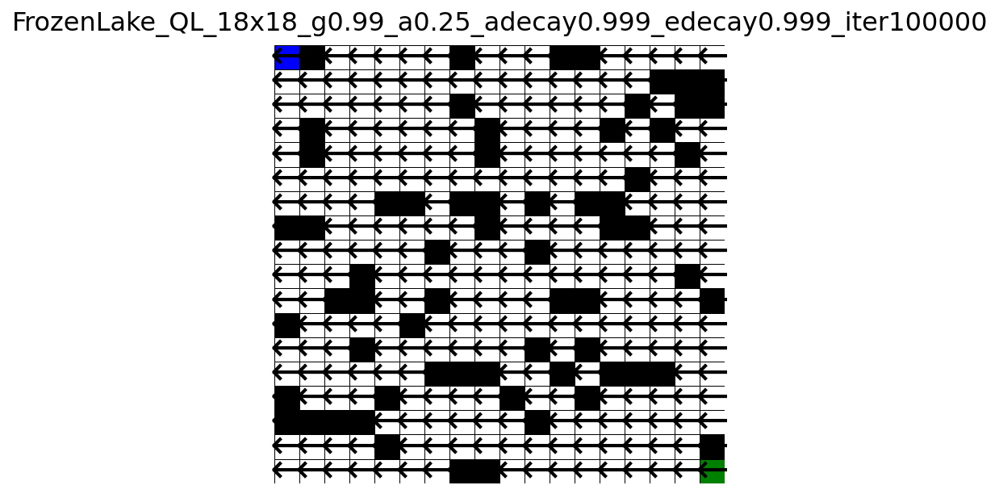

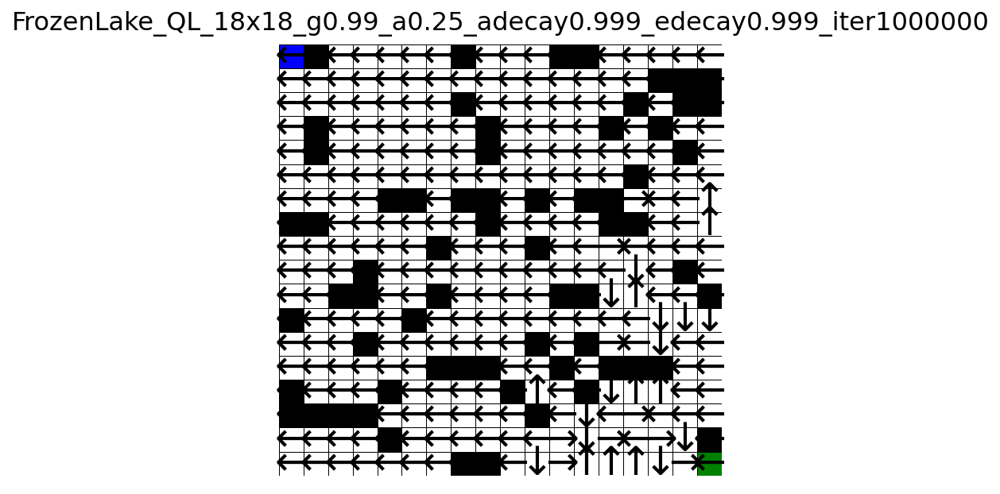

In [26]:
number_iterations = [10000, 100000, 1000000]
alphas,gammas   = [0.01, 0.15, 0.25], [0.1, 0.25, 0.5, 0.75, 0.9, 0.99]
alpha_dec, epsilon_dec = [0.85, 0.999], [0.85, 0.999]

ql_data  = q_learning(T, R, gammas, alphas, alpha_decay=alpha_dec, epsilon_decays=epsilon_dec, n_iterations=number_iterations, show_results=True)

In [ ]:
ql_res = ql_data

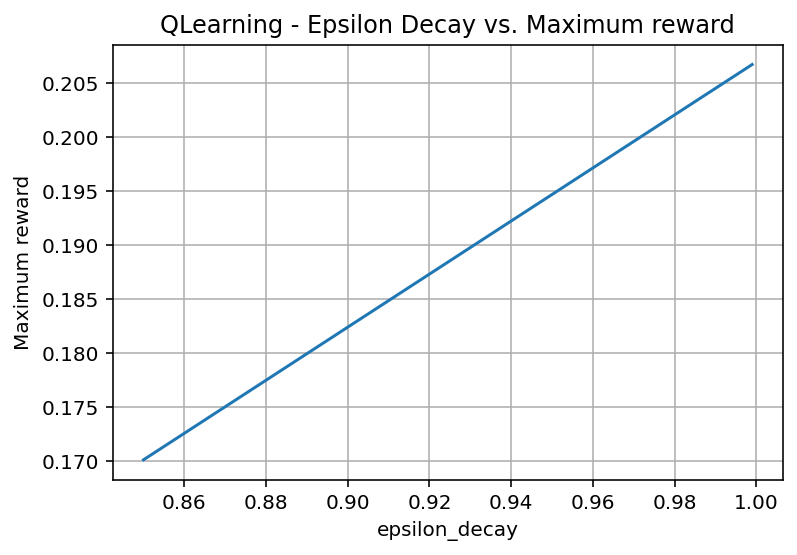

In [32]:
ql_res.groupby('epsilon_decay')['reward'].max().to_frame().plot(legend=False)
plt.xlabel('epsilon_decay')
plt.ylabel('Maximum reward')
plt.grid()
plt.title('QLearning - Epsilon Decay vs. Maximum reward');

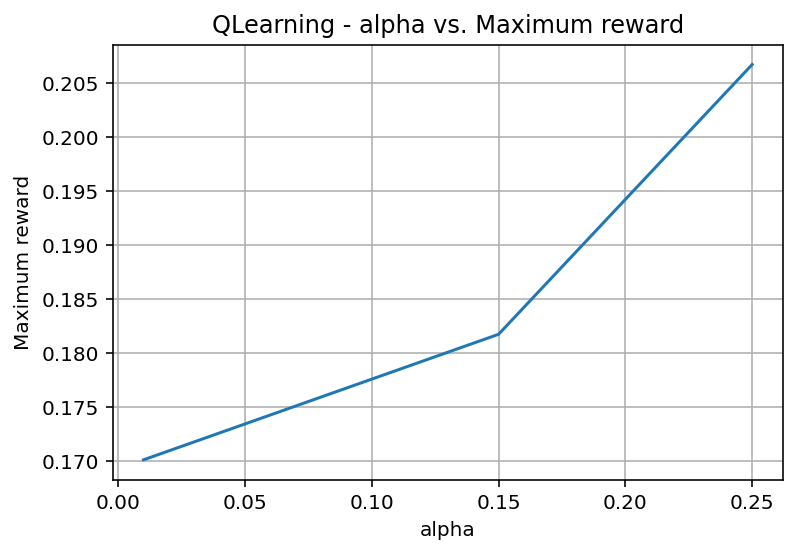

In [33]:
ql_res.groupby('alpha')['reward'].max().to_frame().plot(legend=False)
plt.xlabel('alpha')
plt.ylabel('Maximum reward')
plt.grid()
plt.title('QLearning - alpha vs. Maximum reward');

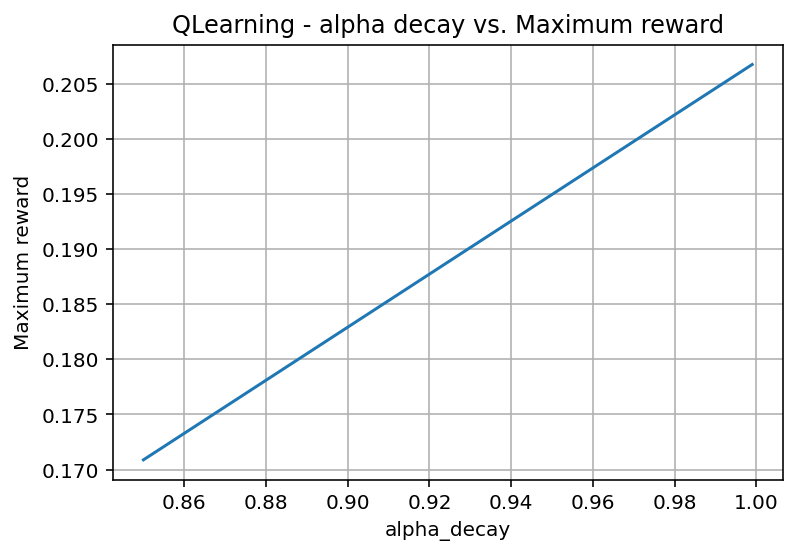

In [34]:
ql_res.groupby('alpha_decay')['reward'].max().to_frame().plot(legend=False)
plt.xlabel('alpha_decay')
plt.ylabel('Maximum reward')
plt.grid()
plt.title('QLearning - alpha decay vs. Maximum reward');

## Policy

In [36]:
best_ql_policy = ql_res['policy'][best_run]
best_ql_policy

'{(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)}'

Best Result:
	Success = 0.00
	Gamma = 0.10,
	Alpha = 0.01,
	Alpha Decay: 0.850,
	Epsilon Decay: 0.850,
	Iterations: 1.0E+04


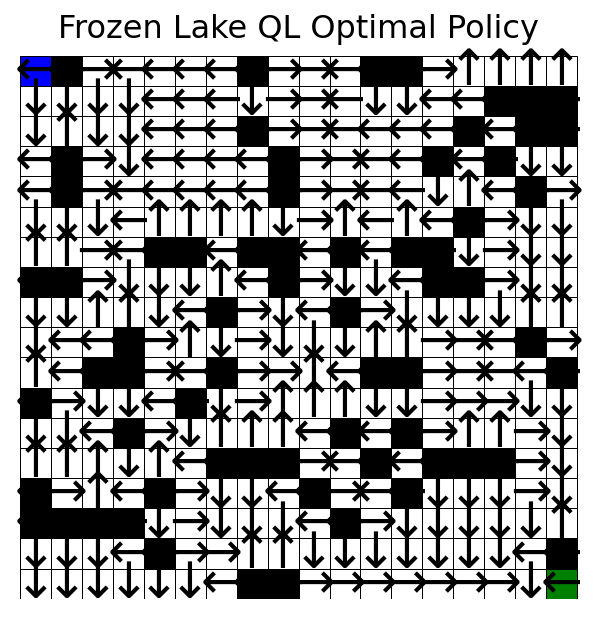

In [37]:
best_run = ql_res['success_percent'].argmax()

best_ql_policy = ql_res['policy'][best_run]

best_ql_policy = best_ql_policy[1:-1]
best_ql_policy = eval(best_ql_policy)
best_ql_policy = np.array(best_ql_policy)
best_ql_policy = best_policy.reshape(rows, cols)

plot_frozen_lake(env, best_ql_policy, 'Frozen Lake QL Optimal Policy')

In [50]:
vi_res['error_mean'] = [list(i) for i in vi_res['error'].values.tolist()]

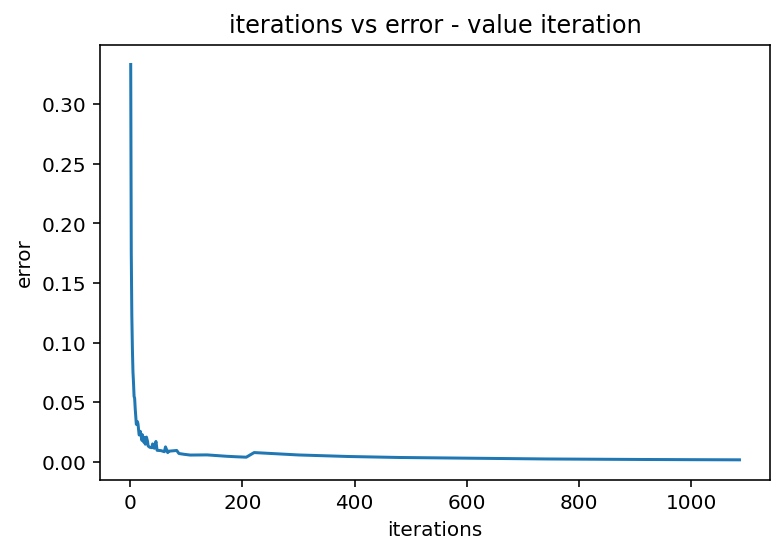

In [76]:
vi_res.groupby('iterations')['error'].mean().plot()
plt.title('iterations vs error - value iteration')
plt.ylabel('error');

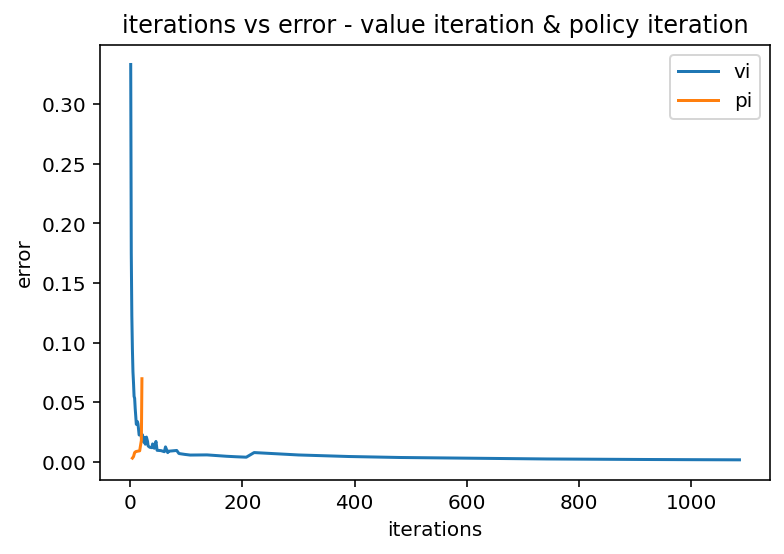

In [83]:
vi_res.groupby('iterations')['error'].mean().plot(label='vi')


pi_res.groupby('iterations')['error'].mean().plot(label='pi')
plt.title('iterations vs error - value iteration & policy iteration')
plt.legend()
plt.ylabel('error');

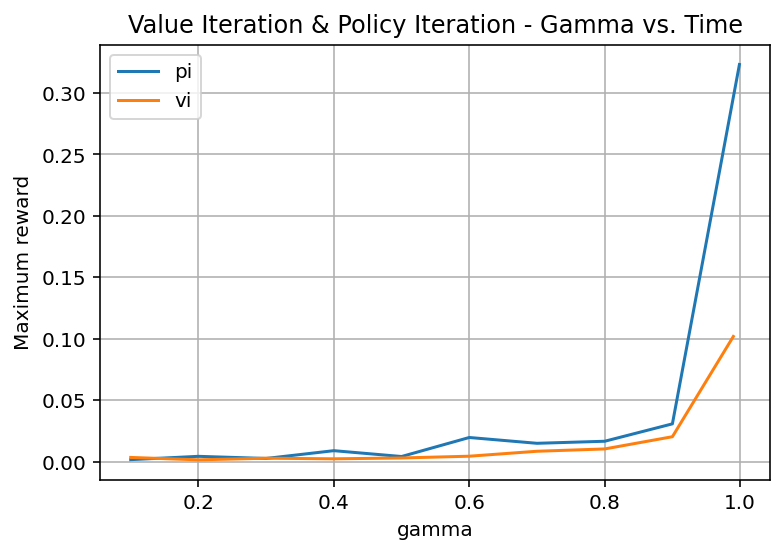

In [84]:
pi_res.groupby('gamma')['time'].max().plot(label='pi')
vi_res.groupby('gamma')['time'].max().plot(label='vi')
plt.xlabel('gamma')
plt.ylabel('Maximum reward')
plt.grid()
plt.legend()
plt.title('Value Iteration & Policy Iteration - Gamma vs. Time');

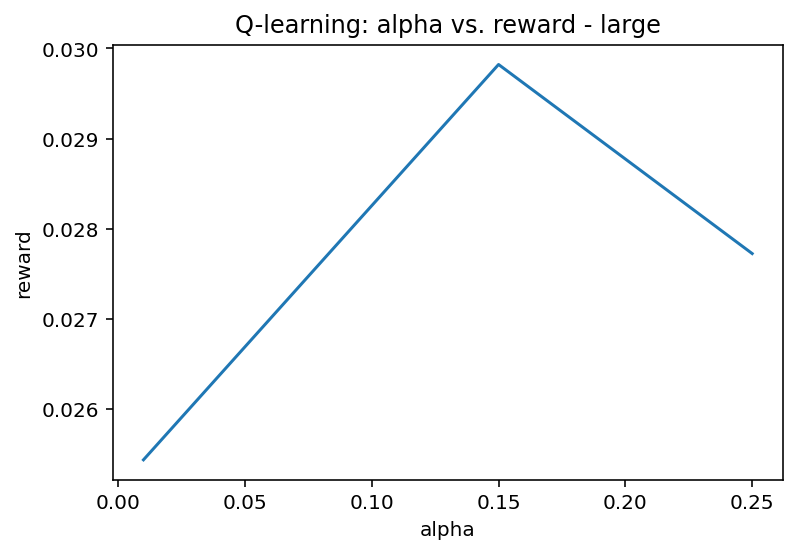

In [92]:
ql_res.groupby('alpha')['reward'].mean().plot()
plt.title('Q-learning: alpha vs. reward - large')

plt.ylabel('reward');

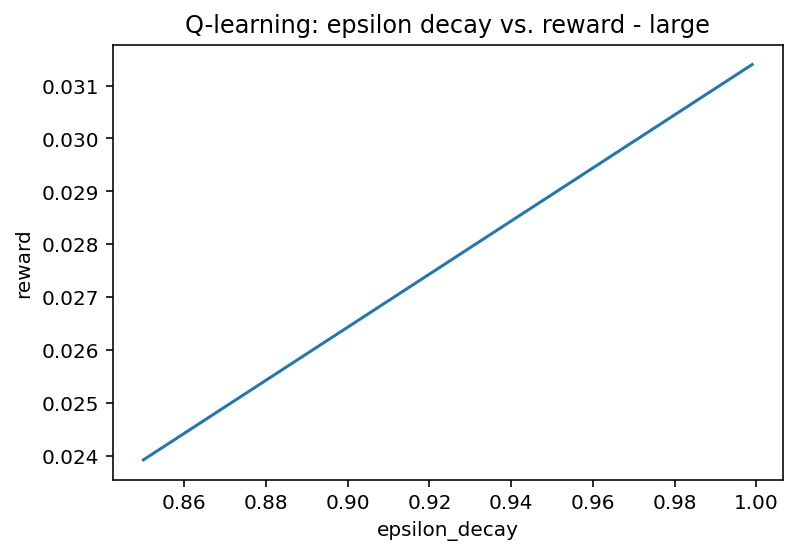

In [93]:
ql_res.groupby('epsilon_decay')['reward'].mean().plot()
plt.title('Q-learning: epsilon decay vs. reward - large')
plt.ylabel('reward');

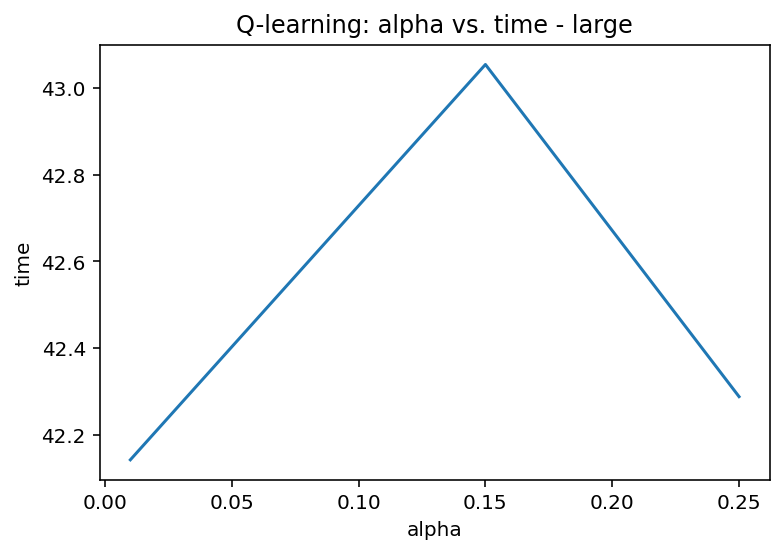

In [94]:
ql_res.groupby('alpha')['time'].mean().plot()
plt.title('Q-learning: alpha vs. time - large')
plt.ylabel('time');

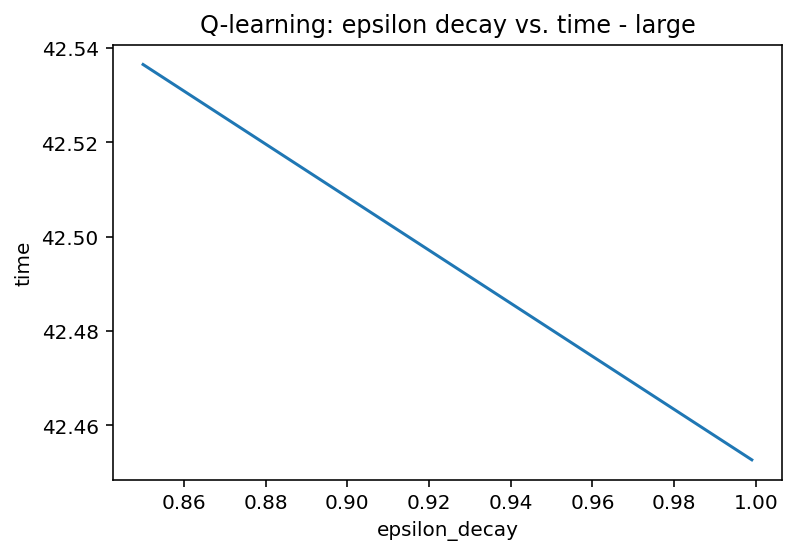

In [95]:
ql_res.groupby('epsilon_decay')['time'].mean().plot()
plt.title('Q-learning: epsilon decay vs. time - large')
plt.ylabel('time');

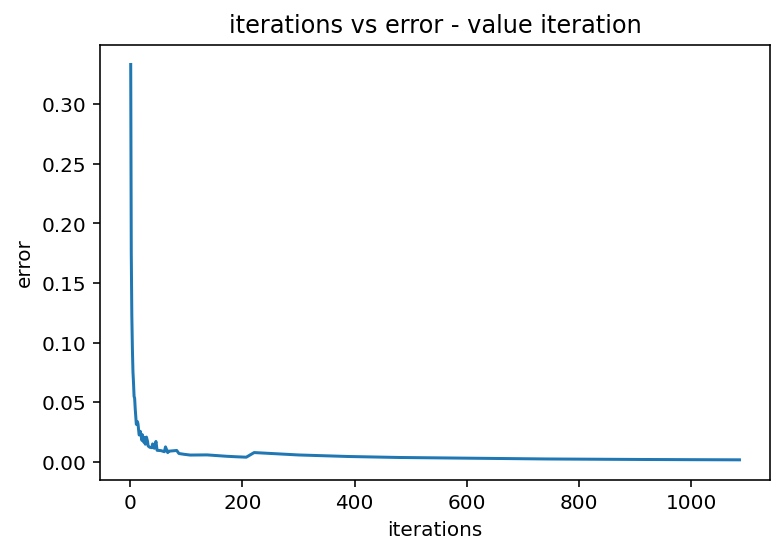

In [97]:
vi_res.groupby('iterations')['error'].mean().plot()
plt.titxle('iterations vs error - value iteration')
plt.ylabel('error');

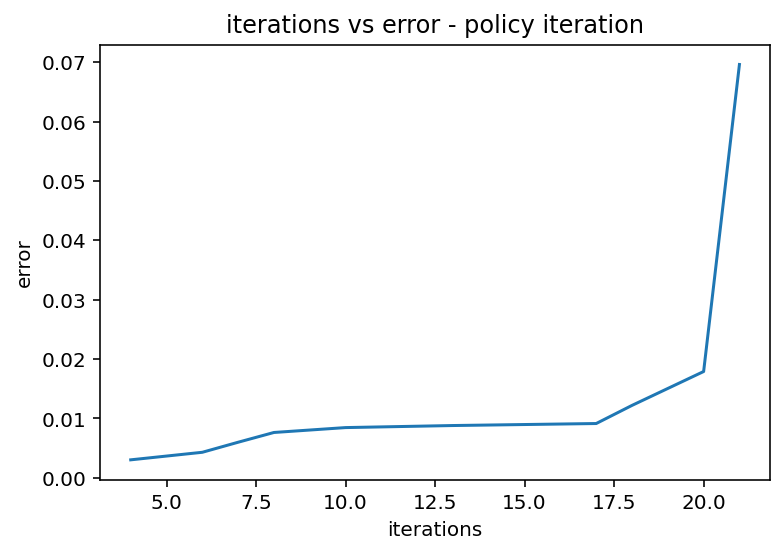

In [102]:
pi_res.groupby('iterations')['error'].mean().plot()
plt.title('iterations vs error - policy iteration')
plt.ylabel('error');

## Problem size plot - VI

In [136]:
vi_problem_size_vs_max_reward = []
for problem_size in range (2,4):

    random_map = generate_random_map(size=problem_size, p=0.8)
 
    env = gym.make("FrozenLake-v0", desc=random_map)
    env.reset()
    env.max_episode_steps=None

    rows, cols = env.nrow, env.ncol
    T, R = np.zeros((4, rows*cols, rows*cols)), np.zeros((4, rows*cols, rows*cols))

    old_state = np.inf

    for square in env.P:
        for action in env.P[square]:
            for i in range(len(env.P[square][action])):
                new_state = env.P[square][action][i][1]
                if new_state == old_state:
                    T[action][square][env.P[square][action][i][1]] = T[action][square][old_state] + env.P[square][action][i][0]
                    R[action][square][env.P[square][action][i][1]] = R[action][square][old_state] + env.P[square][action][i][2]
                else:
                    T[action][square][env.P[square][action][i][1]] = env.P[square][action][i][0]
                    R[action][square][env.P[square][action][i][1]] = env.P[square][action][i][2]
                old_state = env.P[square][action][i][1]

    max_rewardz  = value_iteration2(T, R, gammas, epsilons, problem_size= problem_size, show_results=False)

    vi_problem_size_vs_max_reward.append((problem_size, max_rewardz))


Gamma	Eps	Time	Iter	Reward

Gamma	Eps	Time	Iter	Reward



In [138]:
def value_iteration2(t, r, gammas, epsilons, problem_size, show_results=False, max_iterations=10000000):
    cls = ['gamma', 'epsilon', 'time', 'iterations', 'reward', 'average_steps', 'steps_stddev', 'success_percent', 'policy', 'mean_rewards', 'max_rewards', 'error']
    df = pd.DataFrame(0.0, index=np.arange(len(gammas)*len(epsilons)), columns=cls)
    
    test_num = 0
    for g in gammas:
        for e in epsilons:
            test = ValueIteration(t, r, gamma=g, epsilon=e, max_iter=max_iterations)
            
            runs  = test.run()
            Time  = runs[-1]['Time']
            iters = runs[-1]['Iteration']
            max_reward  = runs[-1]['Max V']
            
            max_rewards, mean_rewards, errors = [], [], []
            for run in runs:
                max_rewards.append(run['Max V'])
                mean_rewards.append(run['Mean V'])
                errors.append(run['Error'])
            
            policy = np.array(test.policy)
            policy = policy.reshape(problem_size,problem_size)
            
            df['gamma'][test_num]        = g
            df['epsilon'][test_num]      = e
            df['time'][test_num]         = Time
            df['iterations'][test_num]   = iters
            df['reward'][test_num]       = max_reward
            df['mean_rewards'][test_num] = {tuple(mean_rewards)}
            df['max_rewards'][test_num]  = {tuple(max_rewards)}
            df['error'][test_num]        = np.mean(errors)
            df['policy'][test_num]       = {test.policy}
            
            test_num += 1

    policies = df['policy']
    
    for i,p in enumerate(policies):
        pol = list(p)[0]
        steps, steps_stddev, failures = generate_score(env, pol, show_results)
        df['average_steps'][i] = steps
        df['steps_stddev'][i]  = steps_stddev
        df['success_percent'][i]   = 100-failures      
        
    df = df.fillna(0)        
    return df['reward'].max()

In [205]:
sizes_vi = pd.DataFrame(vi_problem_size_vs_max_reward, columns =['problem_size', 'max_reward'])

In [193]:
def policy_iteration2(t, r, gammas, problem_size, show_results=False, max_iterations=10000000):
    cls = ['gamma', 'epsilon', 'time', 'iterations', 'reward', 'average_steps', 'steps_stddev', 'success_percent', 'policy', 'mean_rewards', 'max_rewards', 'error']
    data = pd.DataFrame(0.0, index=np.arange(len(gammas)), columns=cls)
        
    test_num = 0
    for g in gammas:
        test = PolicyIteration(t, r, gamma=g, max_iter=max_iterations, eval_type="iterative")
        
        runs, Time, iters, max_reward  = test.run(), test.time, test.iter, runs[-1]['Max V']                
        max_rewards, mean_rewards, errors = [], [], []
        for run in runs:
            max_rewards.append(run['Max V'])
            mean_rewards.append(run['Mean V'])
            errors.append(run['Error'])
        
        policy = np.array(test.policy)
        policy = policy.reshape(problem_size,problem_size)
        
        data['gamma'][test_num], data['time'][test_num]         = g, Time
        data['iterations'][test_num],  data['reward'][test_num]    = iters,  max_reward
        data['mean_rewards'][test_num] = {tuple(mean_rewards)}
        data['max_rewards'][test_num]  = {tuple(max_rewards)}
        data['error'][test_num]        = np.mean(errors)
        data['policy'][test_num]       = {test.policy}
                
        if show_results:
            title = 'frozenlake_pi_' + str(rows) + 'x' + str(cols) + '_g' + str(g)
            plot_frozen_lake(env, policy, title)
        
        test_num = test_num + 1
            

    policies = data['policy']
    
    for i,p in enumerate(policies):
        pol = list(p)[0]
        steps, steps_stddev, failures = generate_score(env, pol, show_results)
        data['average_steps'][i] = steps
        data['steps_stddev'][i]  = steps_stddev
        data['success_percent'][i]   = 100-failures      
        
    data.fillna(0, inplace=True)
        
    return data['reward'].max()

In [194]:
vi_problem_size_vs_max_reward = []
for problem_size in range (2,20):

    random_map = generate_random_map(size=problem_size, p=0.8)
 
    env = gym.make("FrozenLake-v0", desc=random_map)
    env.reset()
    
    env.max_episode_steps=None

    # Create transition and reward matrices from OpenAI P matrix
    rows, cols = env.nrow, env.ncol
    T, R = np.zeros((4, rows*cols, rows*cols)), np.zeros((4, rows*cols, rows*cols))

    old_state = np.inf

    for square in env.P:
        for action in env.P[square]:
            for i in range(len(env.P[square][action])):
                new_state = env.P[square][action][i][1]
                if new_state == old_state:
                    T[action][square][env.P[square][action][i][1]] = T[action][square][old_state] + env.P[square][action][i][0]
                    R[action][square][env.P[square][action][i][1]] = R[action][square][old_state] + env.P[square][action][i][2]
                else:
                    T[action][square][env.P[square][action][i][1]] = env.P[square][action][i][0]
                    R[action][square][env.P[square][action][i][1]] = env.P[square][action][i][2]
                old_state = env.P[square][action][i][1]

    max_rewardz  = value_iteration2(T, R, gammas, epsilons, problem_size= problem_size, show_results=False)

    vi_problem_size_vs_max_reward.append((problem_size, max_rewardz))

/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [200]:
pi_problem_size_vs_max_reward = []
for problem_size in range (2,20):

    random_map = generate_random_map(size=problem_size, p=0.8)
 
    env = gym.make("FrozenLake-v0", desc=random_map)
    env.reset()


    env.max_episode_steps=None

    rows, cols = env.nrow, env.ncol
    T, R = np.zeros((4, rows*cols, rows*cols)), np.zeros((4, rows*cols, rows*cols))

    old_state = np.inf

    for square in env.P:
        for action in env.P[square]:
            for i in range(len(env.P[square][action])):
                new_state = env.P[square][action][i][1]
                if new_state == old_state:
                    T[action][square][env.P[square][action][i][1]] = T[action][square][old_state] + env.P[square][action][i][0]
                    R[action][square][env.P[square][action][i][1]] = R[action][square][old_state] + env.P[square][action][i][2]
                else:
                    T[action][square][env.P[square][action][i][1]] = env.P[square][action][i][0]
                    R[action][square][env.P[square][action][i][1]] = env.P[square][action][i][2]
                old_state = env.P[square][action][i][1]

    pi_res  = policy_iteration2(T, R, gammas, problem_size= problem_size, show_results=False)
    print('pi_res_max', pi_res)
    pi_problem_size_vs_max_reward.append((problem_size, pi_res))

pi_res_max 0.9980039052995269
pi_res_max 0.9950336526121135
pi_res_max 0.9948665815783042
pi_res_max 0.9944366240073741
pi_res_max 0.9864498957285497
pi_res_max 0.9877313514125081
pi_res_max 0.9876501572464469
pi_res_max 0.9937229725288759
pi_res_max 0.9886708065977359
pi_res_max 0.977583752033089
pi_res_max 0.9827374220238898
pi_res_max 0.9780831082838088
pi_res_max 0.9937516586802033
pi_res_max 0.9874623339863213
pi_res_max 0.9917058820082618
pi_res_max 0.9870405474163322
pi_res_max 0.9927982017841512
pi_res_max 0.9868630482439735


In [201]:
sizes_pi = pd.DataFrame(pi_problem_size_vs_max_reward, columns =['problem_size', 'max_reward'])

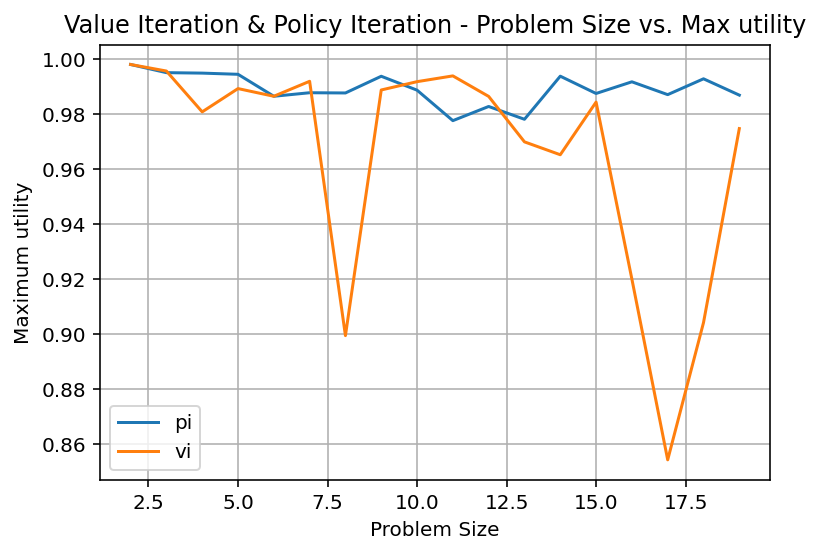

In [209]:
sizes_pi.groupby('problem_size')['max_reward'].max().plot(label='pi')
sizes_vi.groupby('problem_size')['max_reward'].max().plot(label='vi')
plt.xlabel('Problem Size')
plt.ylabel('Maximum utility')
plt.grid()
plt.legend()
plt.title('Value Iteration & Policy Iteration - Problem Size vs. Max utility');